Pandemic Vulnerability Index (PVI)
================================================

We aim to construct a US pandemic vulnerability index (PVI) at the county level to be used by government stakeholders at all level of government. Our model will leverage a collection of region's characteristics as features and local measures of spread of Covid-19 during the pandemic as labels.

The coordination of the Covid-19 containment has been highly uncoordinated, showing a need for all counties and all government stakeholders to access the same information. 

<a id='main-index'></a>
The notebook is divided into the following sections

1. [Import relevant libraries](#Import-relevant-libraries)
2. [Import Data](#Import-Data)
3. [EDA and Feature Engineering](#EDA-and-Feature-Engineering)
4. [Cluster Analysis](#Cluster-Analysis)
4. [Model Design](#Model-Design) \
    4.1. [Helper functions](#Helper-functions) \
    4.2. [Baseline model](#Baseline-model) \
    4.3. [Spatial-lagged model](#Spatial-lagged-model) \
    4.4. [Models with PCA](#Models-with-PCA) \
    4.5. [Model ensembling](#Model-ensembling)
5. [Results](#Results)

## Import relevant libraries

[Back to the main index](#main-index)

In [1]:
# !pip install censusdata
# !pip install pandas_profiling

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 20)
import matplotlib
import matplotlib.pyplot as plt
import censusdata
import re
import copy
import os
print("Current directory:", os.getcwd())

import statsmodels.formula.api as sm
import plotly.graph_objects as go
from urllib.request import urlopen
import json
import plotly.express as px


import scipy
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, PoissonRegressor, Ridge, GammaRegressor, LassoCV, ElasticNetCV, RidgeCV
from sklearn.ensemble import GradientBoostingRegressor as GBR
from sklearn.ensemble import RandomForestRegressor as RFR
from sklearn.ensemble import AdaBoostRegressor as ABR
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor as KNR
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFECV, RFE

from sklearn.model_selection import GroupKFold, StratifiedKFold, StratifiedShuffleSplit, cross_val_predict, cross_val_score, cross_validate
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

from scipy.special import boxcox1p
from scipy.stats import norm, skew #for some statistics

import xgboost

from pandas_profiling import ProfileReport

from collections import defaultdict

%matplotlib inline

import seaborn as sns
import pysal as ps
import geopandas as gpd

import time
import functools
import pickle

sns.set(style="whitegrid")


Current directory: /home/jupyter/final_deliverables/notebooks


/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## Import Data

[Back to the main index](#main-index)

### American Community Survey
https://www.census.gov/programs-surveys/acs/data.html

[Back to the beginning of this section](#Import-Data)


In [3]:
pd.set_option('display.expand_frame_repr', False) 
pd.set_option('display.precision', 2)

#create empty dataframes
temp1 = pd.DataFrame()
data = pd.DataFrame()

#download the data 
for year in range(2018,2019,1): #select years (min=2012, max = 2019)
    for geo in ['county', ]: #select geo areas (by default, selecting each state and US total)
        
        # Download data for each geo level (states and US total) 
        # At this point, select the vars codes in file "ACS2018_Table_Shells.xlsx"
        # IMPORTANT: Add an 'E' at the end of the var code
        
        temp2 = censusdata.download('acs5', year, censusdata.censusgeo([(geo, '*')]),
                                   ['B01001_001E',  # Total population
                                    'B01001_044E',  # female 65 and 66 years
                                    'B01001_045E',  # female 67 to 69 years
                                    'B01001_046E',  # female 70 to 74 years
                                    'B01001_047E',  # female 75 to 79 years
                                    'B01001_048E',  # female 80 to 84 years
                                    'B01001_049E',  # female 85 years and over
                                    'B01001_020E',  # male 65 and 66 years
                                    'B01001_021E',  # male 67 to 69 years
                                    'B01001_022E',  # male 70 to 74 years
                                    'B01001_023E',  # male 75 to 79 years
                                    'B01001_024E',  # male 80 to 84 years
                                    'B01001_025E',  # male 85 years and over
                                    'B10001_001E',  # GRANDCHILDREN UNDER 18 YEARS LIVING WITH A 
                                                        # GRANDPARENT HOUSEHOLDER BY AGE OF GRANDCHILD
                                    'B09005_001E', #Population under 18 years in households 
                                                        #(excluding householders, spouses, and unmarried partners)
                                    'C24010_016E', # healthcare professionals (male)
                                    'C24010_052E'  # healthcare professionals (female)
                                     ])
        
    # I checked if states' sum == US total. Conclusion: it isn't, but just b/c Puerto Rico is a state and 
            # doesn't count in US Total
        temp1 = pd.concat([temp1, temp2], sort = False) # concatenate the dataframes for the different geo levels
    
temp1.head()    



,B01001_001E,B01001_044E,B01001_045E,B01001_046E,B01001_047E,B01001_048E,B01001_049E,B01001_020E,B01001_021E,B01001_022E,B01001_023E,B01001_024E,B01001_025E,B10001_001E,B09005_001E,C24010_016E,C24010_052E
"Sedgwick County, Kansas: Summary level: 050, state:20> county:173",512064,5196,7154,8924,6491,5216,5679,5101,6105,7795,5083,3639,3366,8228,133431,3523.0,11646.0
"Republic County, Kansas: Summary level: 050, state:20> county:157",4686,79,59,171,120,126,169,50,131,109,132,64,70,46,912,6.0,161.0
"Graham County, Kansas: Summary level: 050, state:20> county:065",2545,38,62,52,68,73,58,48,37,68,62,43,73,0,516,13.0,71.0
"Douglas County, Kansas: Summary level: 050, state:20> county:045",119319,1031,1370,1810,1308,766,1203,891,1333,1591,1004,664,526,732,22109,715.0,2804.0
"Sheridan County, Kansas: Summary level: 050, state:20> county:179",2506,40,32,57,64,46,64,22,57,65,50,30,41,23,612,37.0,31.0


In [4]:
temp_new = temp1.rename(columns={"B01001_001E": "tot_pop", 
                              "B01001_044E": "fem_65_66",
                              "B01001_045E": "fem_67_69",
                              "B01001_046E": "fem_70_74",
                              "B01001_047E": "fem_75_79",
                              "B01001_048E": "fem_80_84", 
                              "B01001_049E": "fem_85_more",
                              "B01001_020E": "male_65_66",
                              "B01001_021E": "male_67_69",
                              "B01001_022E": "male_70_74",
                              "B01001_023E": "male_75_79",
                              "B01001_024E": "male_80_84",
                              "B01001_025E": "male_85_more",
                              "B10001_001E": "gdchild_under18_wgdpa",
                              "B09005_001E": "pop_under_18_in_hh",
                              "C24010_016E": "health_prof_male",
                              "C24010_052E": "health_prof_fem"                            
                             })


In [5]:
temp_new.head()

,tot_pop,fem_65_66,fem_67_69,fem_70_74,fem_75_79,fem_80_84,fem_85_more,male_65_66,male_67_69,male_70_74,male_75_79,male_80_84,male_85_more,gdchild_under18_wgdpa,pop_under_18_in_hh,health_prof_male,health_prof_fem
"Sedgwick County, Kansas: Summary level: 050, state:20> county:173",512064,5196,7154,8924,6491,5216,5679,5101,6105,7795,5083,3639,3366,8228,133431,3523.0,11646.0
"Republic County, Kansas: Summary level: 050, state:20> county:157",4686,79,59,171,120,126,169,50,131,109,132,64,70,46,912,6.0,161.0
"Graham County, Kansas: Summary level: 050, state:20> county:065",2545,38,62,52,68,73,58,48,37,68,62,43,73,0,516,13.0,71.0
"Douglas County, Kansas: Summary level: 050, state:20> county:045",119319,1031,1370,1810,1308,766,1203,891,1333,1591,1004,664,526,732,22109,715.0,2804.0
"Sheridan County, Kansas: Summary level: 050, state:20> county:179",2506,40,32,57,64,46,64,22,57,65,50,30,41,23,612,37.0,31.0


In [6]:
temp_new.dtypes

tot_pop                    int64
fem_65_66                  int64
fem_67_69                  int64
fem_70_74                  int64
fem_75_79                  int64
fem_80_84                  int64
fem_85_more                int64
male_65_66                 int64
male_67_69                 int64
male_70_74                 int64
male_75_79                 int64
male_80_84                 int64
male_85_more               int64
gdchild_under18_wgdpa      int64
pop_under_18_in_hh         int64
health_prof_male         float64
health_prof_fem          float64
dtype: object

In [7]:
# Naming some columns

# Total population

data['total_pop'] = temp1.B01001_001E

# % of population > 65-yo
data['percent_seniors'] = (temp1.B01001_020E +temp1.B01001_021E +temp1.B01001_022E +
                                   temp1.B01001_023E +temp1.B01001_024E +temp1.B01001_025E +
                                   temp1.B01001_044E +temp1.B01001_045E +temp1.B01001_046E +
                                  temp1.B01001_047E +temp1.B01001_048E +temp1.B01001_049E) / temp1.B01001_001E * 100
    
# % of population under 18 years with grandparent householder
data['share_granpa_house'] = (temp1.B10001_001E/ temp1.B09005_001E) *100 
    
# # % of occupied house units with >10 units
# data['percent_apartment'] = (temp1.C25032_005E + temp1.C25032_010E) / temp1.C25032_001E *100

# % households with > 5 persons
# data['percent_house_above5'] = (temp1.C11016_006E + temp1.C11016_012E) / temp1.C11016_001E *100

# Healthcare professionals per capita

data['healthcare_prof_pc'] = (temp1.C24010_016E + temp1.C24010_052E) / temp1.B01001_001E *100

data.head()


,total_pop,percent_seniors,share_granpa_house,healthcare_prof_pc
"Sedgwick County, Kansas: Summary level: 050, state:20> county:173",512064,13.62,6.17,2.96
"Republic County, Kansas: Summary level: 050, state:20> county:157",4686,27.32,5.04,3.56
"Graham County, Kansas: Summary level: 050, state:20> county:065",2545,26.80,0.00,3.30
"Douglas County, Kansas: Summary level: 050, state:20> county:045",119319,11.31,3.31,2.95
"Sheridan County, Kansas: Summary level: 050, state:20> county:179",2506,22.67,3.76,2.71


In [8]:
data2 = copy.deepcopy(data)
data2.shape[0]

3220

In [9]:
# cleaning the county name columns

# set the index as string
data2.index = data.index.astype("string")
# clean index
data2.index = data.index.str.replace(": Summary level: 050,","").str.replace("> county:", "").str.split('state:', expand=True)
# rename index
data2.index.names =['county_name', 'countyFIPS']
data2.reset_index(inplace= True)
#set FIPS as index
data2.set_index("countyFIPS", inplace=True)
data2.index = data2.index.astype("str")


### Average Household Size and Population Density (2010 census)
https://www.census.gov/programs-surveys/decennial-census/data/datasets.2010.html

[Back to the beginning of this section](#Import-Data)


In [10]:
density_df = pd.read_csv(r'../data/Average_Household_Size_and_Population_Density_-_County.csv', header = 0, dtype=str)

density_df.rename(columns={"B01001_calc_PopDensity": "pop_density", "GEOID": "countyFIPS", "B25010_001E":"avg_household_size"}, inplace=True)

density_df = density_df[['countyFIPS', 'pop_density', 'avg_household_size']]

density_df.pop_density = density_df.pop_density.astype("float")
density_df.avg_household_size= density_df.avg_household_size.astype("float")

density_df.shape[0]

# # health_ranking_df.health_outcomes = health_ranking_df.health_outcomes.astype("int")
# # health_ranking_df.health_factors = health_ranking_df.health_factors.astype("int")

3220

In [11]:
density_df.describe()

,pop_density,avg_household_size
count,3220.00,3220.00
mean,112.62,2.53
std,693.24,0.28
min,0.01,1.34
25%,6.64,2.35
50%,17.82,2.49
75%,51.35,2.65
max,27819.80,4.97


In [12]:
# profile_density = ProfileReport(density_df, title="Density Profiling Report")

In [13]:
# profile_density

### Health outcomes and factors
2019 data \
https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation

[Back to the beginning of this section](#Import-Data)

In [14]:
health_ranking_df = pd.read_csv(r'../data/2019_County_Health_Rankings_Data.csv', header = 0, dtype=str)
health_ranking_df['health_outcomes'].value_counts()

health_ranking_df = health_ranking_df[health_ranking_df['health_outcomes'] != 'NR']

health_ranking_df['health_factors'].value_counts()



health_ranking_df.health_outcomes = health_ranking_df.health_outcomes.astype("int")
health_ranking_df.health_factors = health_ranking_df.health_factors.astype("int")

health_ranking_df.head()
# health_ranking_df.head()

,countyFIPS,state,county,health_outcomes,health_factors
0,01001,Alabama,Autauga,7,11
1,01003,Alabama,Baldwin,2,3
2,01005,Alabama,Barbour,33,58
3,01007,Alabama,Bibb,40,29
4,01009,Alabama,Blount,22,16


### Covid cases and deaths
https://usafacts.org/visualizations/coronavirus-covid-19-spread-map

[Back to the beginning of this section](#Import-Data)

In [15]:
# import as string and then transform columns of interest into integer - that's because we need 
    #to import fips column as string  
covid_cases_df = pd.read_csv(r'../data/covid_confirmed_usafacts.csv', dtype=str)
for col in covid_cases_df.columns[covid_cases_df.columns.str.contains('/')]:
    covid_cases_df[col] = covid_cases_df[col].astype("int")
covid_deaths_df = pd.read_csv(r'../data/covid_deaths_usafacts.csv', dtype=str)
for col in covid_cases_df.columns[covid_cases_df.columns.str.contains('/')]:
    covid_deaths_df[col] = covid_deaths_df[col].astype("int")
covid_cases_df.head()

,countyFIPS,County Name,State,StateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/20/21,5/21/21,5/22/21,5/23/21,5/24/21,5/25/21,5/26/21,5/27/21,5/28/21,5/29/21
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,01001,Autauga County,AL,1,0,0,0,0,0,0,...,7049,7106,7113,7118,7118,7126,7135,7141,7142,7142
2,01003,Baldwin County,AL,1,0,0,0,0,0,0,...,21489,21511,21535,21546,21554,21578,21593,21606,21620,21620
3,01005,Barbour County,AL,1,0,0,0,0,0,0,...,2326,2327,2328,2328,2328,2331,2331,2333,2334,2334
4,01007,Bibb County,AL,1,0,0,0,0,0,0,...,2656,2657,2656,2658,2659,2660,2662,2666,2664,2664


In [16]:
# print(covid_df.head())
# %matplotlib inline
# # plt.plot(np.array(covid_df[covid_df['countyFIPS'] == 1003].iloc[:, 4:])[0])

# covid_cases_df.countyFIPS.astype("str")

### Presidential vote and others from Scott

Scott please add references

[Back to the beginning of this section](#Import-Data)

In [17]:
df_combined = pd.read_csv(r'../data/combined_data_0617.csv', header = 0)

df_senate = pd.read_csv(r'../data/combined_data_0622.csv', header = 0)

df_senate = df_senate[['countyFIPS', '2016_senate_vote_split']]

df_fund_ops = pd.read_csv(r'../data/final_data_state_funding_data_opiod_deaths.csv', header = 0)

print(list(df_fund_ops))
fund_ops =  ['countyFIPS', 
 'Opioid_deaths_per_100k_1999-2019','Sum_healthcare_quality_per_person',
 'Sum_healthlab_per_person',
 'Sum_injury_prevention_per_person',
 'Sum_other_per_person']
# df['Fruit Total']= df.iloc[:, -4:-1].sum(axis=1)
df_fund_ops = df_fund_ops[fund_ops]

df_combined = pd.merge(df_combined, df_senate, how="left", on=['countyFIPS'])
df_combined = pd.merge(df_combined, df_fund_ops, how="left", on=['countyFIPS'])

df_combined  = df_combined.loc[:, ~df_combined.columns.str.contains('^Unnamed')]
df_combined = df_combined.rename(columns={                         
                              "B01001_calc_PopDensity": "pop_density", 
                              "B25010_001E":"avg_household_size",
                              "Average":"pres_vote_average"
                            })

df_combined = df_combined[df_combined.countyFIPS.isna()==False]


#adjusting fips column (they must have 5 digits)
df_combined.countyFIPS = df_combined.countyFIPS.astype("int").astype("string")
for index in df_combined.index:
    if len(df_combined.loc[index,'countyFIPS'])==4:
        df_combined.loc[index,'countyFIPS'] = "0" + df_combined.loc[index,'countyFIPS']
  

# # finding the variables of interest
var_list_all = list(df_combined)
# print(var_list_all)

vars_of_interest = ["countyFIPS", "StateFIPS",'Pres Vote - 2016'] + var_list_all[var_list_all.index('Years of Potential Life Lost Rate'):]
df_combined = df_combined[vars_of_interest]

# print(list(df_combined))


df_combined.head()



['countyFIPS', 'County Name', 'State', 'lon', 'lat', 'StateFIPS', 'Cumulative Cases', 'Cumulative Deaths', 'Health Outcomes', 'Health Factors', 'B01001_calc_PopDensity', 'Pres Vote - 2000', 'Pres Vote - 2004', 'Pres Vote - 2008', 'Pres Vote - 2012', 'Pres Vote - 2016', 'Average', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days', '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking', 'Driving Deaths per person', '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured', 'Primary Care Physicians Ratio', 'Dentist Ratio', 'Mental Health Provider Ratio', 'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated (Flu)', 'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty', 'Inco

,countyFIPS,StateFIPS,Pres Vote - 2016,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Smokers,% Adults with Obesity,...,% Non-Hispanic White,% Not Proficient in English,% Female,% Rural,2016_senate_vote_split,Opioid_deaths_per_100k_1999-2019,Sum_healthcare_quality_per_person,Sum_healthlab_per_person,Sum_injury_prevention_per_person,Sum_other_per_person
0,01001,1.0,-49.00,8128.59,20.88,4.74,4.65,8.62,18.08,33.3,...,74.31,0.82,51.45,42.00,-0.48,6.6,321.30,401.55,8.33,1355.06
1,01003,1.0,-57.16,7354.12,17.51,4.22,4.30,8.35,17.49,31.0,...,83.11,0.54,51.54,42.28,-0.59,12.4,81.94,102.40,2.12,345.57
2,01005,1.0,-5.57,10253.57,29.59,5.43,5.19,11.47,22.00,41.7,...,45.64,1.63,47.22,67.79,-0.06,12.8,717.99,897.33,18.61,3028.11
3,01007,1.0,-55.15,11977.54,19.44,4.59,4.55,10.31,19.11,37.6,...,74.59,0.27,46.78,68.35,-0.52,13.2,797.52,996.72,20.68,3363.51
4,01009,1.0,-80.91,11335.07,21.75,4.86,4.89,7.60,19.21,33.8,...,86.89,1.72,50.73,89.95,-0.76,14.0,308.86,386.00,8.01,1302.60


### Join the feature datasets

[Back to the beginning of this section](#Import-Data)

In [18]:
data3 = pd.merge(data2, health_ranking_df, how="left", on=['countyFIPS'])
data3 = pd.merge(data3, density_df, how="left", on=['countyFIPS'])
data3 = pd.merge(data3, df_combined, how="left", on=['countyFIPS'])


#finding constant columns

data4= data3.loc[:,data3.apply(pd.Series.nunique) != 1]

#get today's data
timestr = time.strftime("%m%d")

# write
data4.to_csv("../data/raw_data_"+timestr+".csv")

print([i for i in list(data3) if i not in list(data4)])



['Other Primary Care Provider Ratio']


### Maps charts for monitoring

[Back to the beginning of this section](#Import-Data)

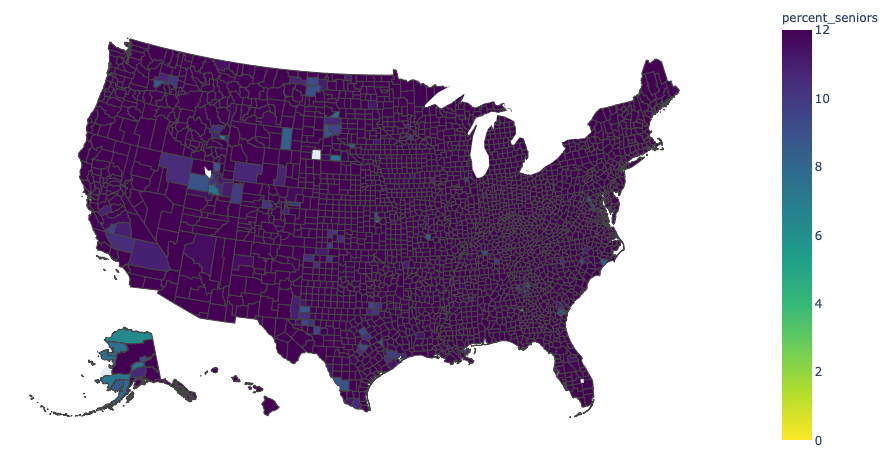

In [19]:

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]



fig = px.choropleth(data4, geojson=counties, locations='countyFIPS', color='percent_seniors',
                           color_continuous_scale="Viridis_r",
                           range_color=(0, 12),
                           scope="usa",
                           labels={'PVI':'PVI'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Define data to consider and join the the Covid-19 data

[Back to the beginning of this section](#Import-Data)

In [20]:
print(data4.dropna().shape[0])

# define date of covid deaths and cases to consider
last_date = -240 #240 refers to Oct-20 (for Pres 1 in class)

date = list(covid_cases_df)[last_date]

# join with the features dataset
data = copy.deepcopy(data4)
data = pd.merge(data, covid_cases_df[['countyFIPS', date]], how="left", on=['countyFIPS'])
data.rename(columns={date: "num_cases"}, inplace=True)
data = pd.merge(data, covid_deaths_df[['countyFIPS', date]], how="left", on=['countyFIPS'])
data.rename(columns={date: "num_deaths"}, inplace=True)

# covid cases and deaths per capita

data['covid_cases_pc'] = data.num_cases / data.total_pop * 100
data['covid_deaths_pc'] = data.num_deaths / data.total_pop * 100
data['Driving Deaths per capita'] = data['# Driving Deaths'] / data.total_pop * 100


data.drop(['Population', "num_cases", "num_deaths",  'county_name', '# Driving Deaths'], axis=1, inplace=True) 
corr_matrix = data.corr()
data = data.dropna()
# plt.scatter(data.pres_vote_average,data.covid_deaths_pc)
# plt.show()
# # plt.plot(data.covid_deaths_pc,LinearRegression().fit(np.array(data['pres_vote_average']).reshape(-1, 1),data.covid_deaths_pc).predict(np.array(data.pres_vote_average).reshape(-1,1)), color='red')
# plt.scatter(data.covid_deaths_pc,LinearRegression().fit(np.array(data['pres_vote_average']).reshape(-1, 1),data.covid_deaths_pc).predict(np.array(data.pres_vote_average).reshape(-1,1)), color='red')
# r2_score(data.covid_deaths_pc, LinearRegression().fit(np.array(data['pres_vote_average']).reshape(-1, 1),data.covid_deaths_pc).predict(np.array(data.pres_vote_average).reshape(-1,1)))

3080


In [21]:

# define features set
factors = list(data.drop(['countyFIPS', 'StateFIPS','state', 'county'], axis=1))
features = [i for i in factors if i != 'covid_deaths_pc' and i != 'covid_cases_pc' and i !='total_pop']
# features_log = [i for i in features if i == 'pop_density' or  i == "avg_household_size" ]
# features_notlog = [i for i in features if i != 'pop_density' and i!= "avg_household_size" ]

#create the regression df and check the share of rows with NaN
regression_df = copy.deepcopy(data.dropna())
# eliminates one county that is causing problems because it's is not the census' shapefile (that gives geo info)
regression_df = regression_df.loc[ regression_df.countyFIPS != '02261', : ]
regression_df.reset_index(inplace = True)
regression_df.drop('index', axis=1, inplace=True) 

print(regression_df.shape[0]/data.shape[0])


# define X and y
# X_log = np.log(regression_df[features_log])
X = regression_df[features]
# X = pd.concat([X_log, X_notlog], axis=1)
y = regression_df[['covid_deaths_pc']]


print(X.shape[1])
regression_df.tail()

0.9996753246753247
88


,countyFIPS,total_pop,percent_seniors,share_granpa_house,healthcare_prof_pc,state,county,health_outcomes,health_factors,pop_density,...,% Rural,2016_senate_vote_split,Opioid_deaths_per_100k_1999-2019,Sum_healthcare_quality_per_person,Sum_healthlab_per_person,Sum_injury_prevention_per_person,Sum_other_per_person,covid_cases_pc,covid_deaths_pc,Driving Deaths per capita
3074,16003,4019,28.07,5.56,1.00,Idaho,Adams,30.0,27.0,1.14,...,100.00,-0.47,6.96,1294.05,710.27,704.49,7105.26,0.72,4.98e-02,0.32
3075,16053,23431,12.53,3.89,2.35,Idaho,Jerome,29.0,35.0,15.14,...,51.32,-0.54,6.80,229.01,125.70,124.68,1257.44,3.41,2.99e-02,0.20
3076,16061,3845,24.29,11.91,1.30,Idaho,Lewis,24.0,38.0,3.10,...,100.00,-0.61,6.96,1424.43,781.83,775.47,7821.12,0.94,2.60e-02,0.18
3077,16073,11455,17.54,3.22,0.65,Idaho,Owyhee,42.0,41.0,0.58,...,77.29,-0.61,10.40,470.34,258.16,256.06,2582.52,2.92,4.36e-02,0.08
3078,16021,11549,21.07,5.30,1.36,Idaho,Boundary,9.0,25.0,3.51,...,76.18,-0.59,10.80,460.31,252.65,250.59,2527.40,0.51,8.66e-03,0.06


## EDA and Feature Engineering

[Back to the main index](#main-index)

### Checking the distribution of the dependent variable

[Back to the beginning of this section](#EDA-and-Feature-Engineering)

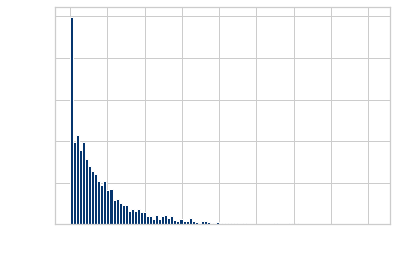

In [22]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.hist(np.log1p(regression_df['covid_deaths_pc']), bins = 100, color='#05356e');
ax.set_xlabel('Covid deaths pc')
ax.set_ylabel('# of counties')

# ax.spines['bottom'].set_color('red')
# ax.spines['top'].set_color('red')
ax.xaxis.label.set_color('white')
ax.tick_params(axis='x', colors='white')
ax.yaxis.label.set_color('white')
ax.tick_params(axis='y', colors='white')

### Correlation table

[Back to the beginning of this section](#EDA-and-Feature-Engineering)

In [23]:
# spotting highly correlated features and delete them

corr_matrix = X.corr()

correlated_features = []
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
#             colname = corr_matrix.columns[i]
            correlated_features.append([corr_matrix.columns[i],corr_matrix.columns[j]])
#             print([corr_matrix.columns[i],corr_matrix.columns[j]])


# print(correlated_features)
print()
print("-----------------------")

# delete some
# X.drop(['% Children in Poverty','Teen Birth Rate', '% Hispanic','Average Number of Physically Unhealthy Days','% Frequent Mental Distress', '% Frequent Physical Distress', 'Average Number of Mentally Unhealthy Days','health_outcomes'], axis=1, inplace=True) 
X.drop(['% Frequent Physical Distress', 'health_outcomes', '% Frequent Mental Distress', 'Average Number of Physically Unhealthy Days','% Hispanic','percent_seniors','Teen Birth Rate','% Children in Poverty'], axis=1, inplace=True)
corr_matrix = X.corr()
correlated_features = []
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
#             colname = corr_matrix.columns[i]
            correlated_features.append([corr_matrix.columns[i],corr_matrix.columns[j]])
            print([corr_matrix.columns[i],corr_matrix.columns[j]])


# print(correlated_features)
print(X.shape[1])
x = list(X)



-----------------------
80


/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4315: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



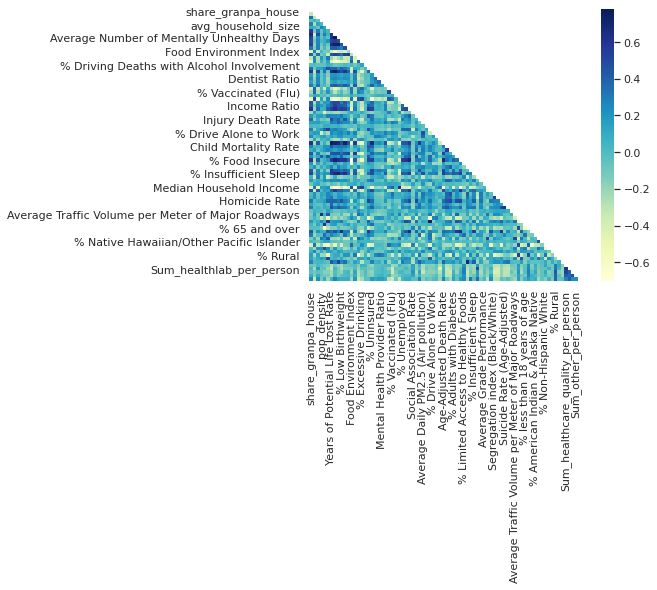

In [24]:
#data_corr = data
import seaborn as sns


corr_matrix = X.corr()


mask = np.zeros_like(corr_matrix )
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr_matrix , mask=mask, square=True,cmap="YlGnBu" )


f.savefig("Heatmap")


In [25]:
# profile = ProfileReport(pd.concat([y,X],axis=1), title="Profiling Report", explorative=True)
# profile

<a id='class-def-cell'></a>
### Splitting features into classes

[Back to the beginning of this section](#EDA-and-Feature-Engineering)

At this point, we'll divide our features into the following classes:

Demographics \
Violence and social distress \
Traffic and commuting \
Enviroment \
Physical_health \
Behavioral_health \
Health system \
Political leanings \
Income and housing risks \
Education

The composition of each class is defined as follows:

In [26]:
demographic = ['share_granpa_house',
 'pop_density',
 'avg_household_size',
 'Segregation index (Black/White)',
 'Segregation Index (White/Not-White)',
 '% less than 18 years of age',
 '% 65 and over',
 '% Black',
 '% American Indian & Alaska Native',
 '% Asian',
 '% Native Hawaiian/Other Pacific Islander',
 '% Non-Hispanic White',
 '% Not Proficient in English',
 '% Female',
 '% Rural',
'Social Association Rate'] 

political = [ 'Pres Vote - 2016', 
              '2016_senate_vote_split',] 

education = [ 'High School Graduation Rate',
 '% Some College',
 'Average Grade Performance']

violence = [ 
 'Violent Crime Rate',
 'Injury Death Rate',
 'Homicide Rate',
 'Firearm Fatalities Rate',
 'Juvenile Arrest Rate'] 
#'Driving Deaths per capita',
traffic = [ '% Drive Alone to Work',
 '% Long Commute - Drives Alone',
 'Average Traffic Volume per Meter of Major Roadways']

income = [ '% Food Insecure',
 '% Limited Access to Healthy Foods',
 '% Uninsured (Children)',
 '% Uninsured',        
 '% Disconnected Youth',
 'Median Household Income',
 '% Enrolled in Free or Reduced Lunch',
 '% Homeowners',
 '% Severe Housing Cost Burden',
 '% Unemployed', 
 'Income Ratio', 
 '% Single-Parent Households', 
 '% Severe Housing Problems']

environment = [ 'Average Daily PM2.5 (Air pollution)',
 'Presence of Water Violation'] 

physical_health = [ 'health_factors',
 'Years of Potential Life Lost Rate',
 '% Fair or Poor Health',
 '% Low Birthweight',
 '% Adults with Obesity',
 'Food Environment Index',
 '% Physically Inactive',
 '% With Access to Exercise Opportunities',
 'Chlamydia Rate',
 'Preventable Hospitalization Rate',
 '% With Annual Mammogram',
 '% Vaccinated (Flu)',
 'Life Expectancy',
 'Child Mortality Rate',
 'Infant Mortality Rate',
 '% Adults with Diabetes',
 'HIV Prevalence Rate',
 'Age-Adjusted Death Rate'] 


behavioral_health = ['% Excessive Drinking',
 'Drug Overdose Mortality Rate',
 '% Insufficient Sleep',
 'Suicide Rate (Age-Adjusted)',
 'Average Number of Mentally Unhealthy Days',
 '% Smokers',
'Motor Vehicle Mortality Rate', 
'% Driving Deaths with Alcohol Involvement',
                    ]

health_system = [ 'healthcare_prof_pc',
 'Primary Care Physicians Ratio',
 'Dentist Ratio',
 'Mental Health Provider Ratio'] 





In [27]:

# check if all features in classes are in the list of factors x (some factors were deleted because of 
# high correlation with other factors, so this process does this ckeck)
fac = demographic + violence + traffic + environment + health_system + physical_health + behavioral_health   + political + income + education
print([i for i in fac if i not in x])
print([i for i in x if i not in fac])

demographic = [i for i in demographic if i in x]
violence= [i for i in violence if i in x]
traffic  = [i for i in traffic  if i in x]
environment = [i for i in environment if i in x]
health_system = [i for i in health_system  if i in x]
physical_health = [i for i in physical_health if i in x]
behavioral_health = [i for i in behavioral_health if i in x]
political  = [i for i in political  if i in x]
income = [i for i in income if i in x]
education = [i for i in education if i in x]

fac = demographic + violence + traffic + environment + health_system + physical_health + behavioral_health + political + income + education
print([i for i in fac if i not in x])

# create a dictionary of lists
list_of_values = [demographic , violence , traffic , environment , health_system, physical_health, behavioral_health  , political , income , education]
list_of_keys = ["demographic","violence" ,"traffic", "environment", "health_system", "physical_health", "behavioral_health", "political", "income", "education"]

features_per_class = dict(zip(list_of_keys,list_of_values))
print("# of features per class")
print("total", len(fac))
print("demographic", len(demographic))
print("violence", len(violence))
print("traffic", len(traffic))
print('environment', len(environment))
print("health_system", len(health_system))
print("physical_health", len(physical_health))
print("behavioral_health", len(behavioral_health))
print("political", len(political))
print("income", len(income))
print("education", len(education))

[]
['Opioid_deaths_per_100k_1999-2019', 'Sum_healthcare_quality_per_person', 'Sum_healthlab_per_person', 'Sum_injury_prevention_per_person', 'Sum_other_per_person', 'Driving Deaths per capita']
[]
# of features per class
total 74
demographic 16
violence 5
traffic 3
environment 2
health_system 4
physical_health 18
behavioral_health 8
political 2
income 13
education 3


## Cluster Analysis

[Back to the main index](#main-index)

### Cluster of states

[Back to the beginning of this section](#Cluster-Analysis)

We need to make sure that train and test samples are balanced. Thus we'll cluster states with similar caracteristics so we can do a stratified CV.

#### Average features by state

In [28]:
# make a copy of the main DF 
regression_df_custer = copy.deepcopy(regression_df)

# create a DF with the features and the total pop
X_with_pop = regression_df_custer[x + ["total_pop","state"]]

In [29]:
# create auxiliary functions for the weighted average

def my_w_avg(s, df, wcol):
    '''
    Calculate the weighted average of series s in dataframe df using wcol as weights 
    '''
    return np.average(s, weights=df.loc[s.index, wcol])

def weighted_series(df, targetcol, groupcol, wcol):
    '''
    Calculate the the weighted average of series targetcol in dataframe df using wcol as weights,  
    grouping by groupcol
    Output: a dataframe with one variable named targetcol (weighted averaged) and groupcol as index 
    '''
    return df.groupby(groupcol).agg(
        W_AVG_QTY = (targetcol, functools.partial(my_w_avg, df=df, wcol= wcol)))\
        .rename(columns={"W_AVG_QTY": targetcol})

def weighted_df(df,groupcol,  wcol):
    '''
    Create a dataframe with weighted averages of all columns of df by groupcol, using wcol as weights.  
    '''
    x = list(df)
    x.remove(groupcol)
    x.remove(wcol)
    w_df = df.groupby(groupcol).agg(num_counties = (groupcol, 'count'), sum_of_w = (wcol, 'sum') )\
    .rename(columns={'sum_of_w': wcol})
    
    for targetcol in x:
        w_df0 = copy.deepcopy(w_df)
        w_df1 = weighted_series(df, targetcol, groupcol, wcol)
        w_df = pd.concat([w_df0, w_df1], axis=1)

    return w_df

In [30]:
# new DF at the sate level with features weighted by county pop
regression_df_states = weighted_df(X_with_pop, 'state', 'total_pop')
X = regression_df_states[x]

#### Principal components of features per class

Sates will be divided into clusters claculated based on the 1st PC of features per class. 

Classes were defined above [here](#class-def-cell).

In [31]:
# PCA of features
n_components=1

scaler = StandardScaler()
random_state=12345
var_dict = {}

regression_df_states_pca  = regression_df_states[['total_pop' ]]
for feat_class in features_per_class.keys():
    standardized_X = scaler.fit_transform(X[features_per_class[feat_class]])
    size = X.loc[:,features_per_class[feat_class]].shape[1]
    if size >= n_components:
        pca = PCA(n_components=n_components, random_state=random_state)
        new_X = pca.fit_transform(standardized_X)
    else:
        pca = PCA(n_components=size, random_state=random_state)
        new_X = pca.fit_transform(standardized_X)
    comp = min(n_components,size)
    for n_comp in range(comp):
        regression_df_states_pca.loc[:,feat_class + "_" + str(n_comp)] = new_X[:,n_comp]

    var_dict[feat_class] = pca.explained_variance_ratio_


regression_df_states_pca  = regression_df_states_pca.drop('total_pop', axis=1)


/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

In [32]:
regression_df_states_pca.head()

,demographic_0,violence_0,traffic_0,environment_0,health_system_0,physical_health_0,behavioral_health_0,political_0,income_0,education_0
state,,,,,,,,,,
Alabama,3.65e-03,2.23,-0.79,-1.66,3.32,6.35,3.06,-1.52,2.31,-1.25
Alaska,-1.30e+00,2.09,-0.63,3.10,-1.89,-0.59,-1.65,0.50,1.23,1.86
Arizona,8.76e-01,0.77,0.89,0.92,0.33,-0.94,0.31,-0.33,1.73,0.78
Arkansas,-9.51e-01,1.56,-1.12,-0.26,2.00,5.11,2.40,-1.33,2.82,-1.30
California,3.96e+00,-1.25,1.98,-0.40,-1.50,-3.51,-1.66,3.97,-3.08,0.40


#### Split states into clusters

<AxesSubplot:xlabel='n_clusters'>

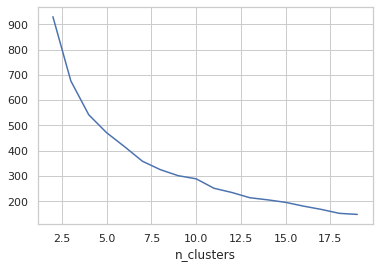

In [33]:
# Find the optimal number of clusters
# Reference for the code
# https://stackoverflow.com/questions/65991074/how-to-find-most-optimal-number-of-clusters-with-k-means-clustering-in-python

X = copy.deepcopy(regression_df_states_pca)
seed_random = 12345

fitted_kmeans = {}
labels_kmeans = {}
df_scores = []
k_values_to_try = np.arange(2, 20)
for n_clusters in k_values_to_try:
    
    #Perform clustering.
    kmeans = KMeans(n_clusters=n_clusters,
                    random_state=seed_random,
                    )
    labels_clusters = kmeans.fit_predict(X)
    
    #Insert fitted model and calculated cluster labels in dictionaries,
    #for further reference.
    fitted_kmeans[n_clusters] = kmeans
    labels_kmeans[n_clusters] = labels_clusters
    
    #Calculate various scores, and save them for further reference.
    silhouette = silhouette_score(X, labels_clusters)
    ch = calinski_harabasz_score(X, labels_clusters)
    db = davies_bouldin_score(X, labels_clusters)
    elbow = kmeans.inertia_
    tmp_scores = {"n_clusters": n_clusters,
                  "silhouette_score": silhouette,
                  "calinski_harabasz_score": ch,
                  "davies_bouldin_score": db,
                  "elbow_score": elbow,
                  }
    df_scores.append(tmp_scores)

#Create a DataFrame of clustering scores, using `n_clusters` as index, for easier plotting.
df_scores = pd.DataFrame(df_scores)
df_scores.set_index("n_clusters", inplace=True)

df_scores["elbow_score"].plot()

The optimal number of clusters is unclear, but we'll use 5 because we need that a sizeable amout of states are placed in every cluster (for the stratified cross validation).

In [34]:
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters,
                random_state=seed_random,
                )
labels_clusters = {"labels" : kmeans.fit_predict(X), "state": X.index}

labels_clusters_df = pd.DataFrame(labels_clusters)

labels_clusters_df.groupby("labels").count()

,state
labels,
0,11
1,12
2,12
3,5
4,11


Note that the smallest cluster has 5 states - this will interfere in the maximum number of folds in the cross-validation step. 

In [35]:
labels_clusters_df.head()

,labels,state
0,2,Alabama
1,0,Alaska
2,1,Arizona
3,2,Arkansas
4,3,California


In [36]:
# Choropleth Maps in Python read states by codes, not names 

state_codes = {
    'District of Columbia' : 'dc','Mississippi': 'MS', 'Oklahoma': 'OK', 
    'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 
    'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 
    'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 
    'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 
    'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 
    'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 
    'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI',
    'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 
    'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 
    'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 
    'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 
    'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 
    'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 
    'Nevada': 'NV', 'Maine': 'ME'}

labels_clusters_df['state_code'] = labels_clusters_df['state'].apply(lambda x : state_codes[x])

labels_clusters_df.head()

,labels,state,state_code
0,2,Alabama,AL
1,0,Alaska,AK
2,1,Arizona,AZ
3,2,Arkansas,AR
4,3,California,CA


In [37]:
# create a function to run state charts

def state_chart(df, column_name):


    fig = go.Figure(data=go.Choropleth(
        locations=df.state_code, # Spatial coordinates
        z = df[column_name].astype(str), # Data to be color-coded
        locationmode = 'USA-states', # set of locations match entries in `locations`
        colorscale = 'Blues',

    ))

    fig.update_layout(
        title_text = 'Cluster by State',
        geo_scope='usa', # limite map scope to USA
    )

    fig.show()


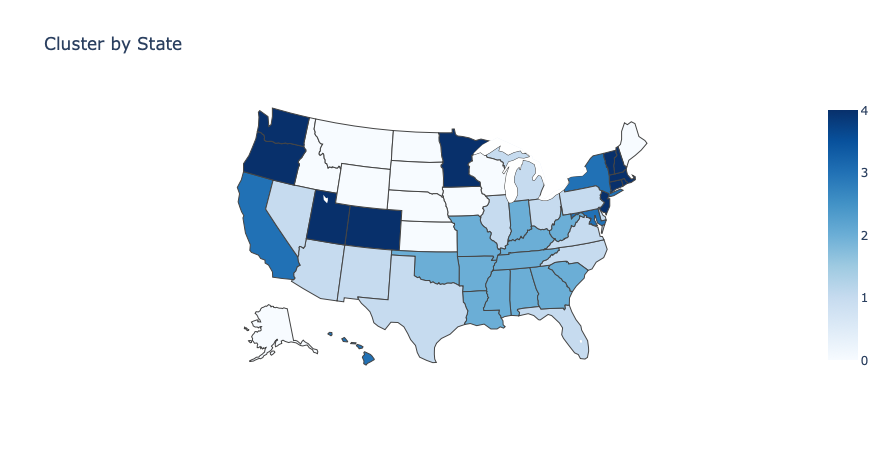

In [38]:
state_chart(labels_clusters_df,'labels')

In [39]:
labels_clusters_df.head()

,labels,state,state_code
0,2,Alabama,AL
1,0,Alaska,AK
2,1,Arizona,AZ
3,2,Arkansas,AR
4,3,California,CA


### Split the data into train, validation and test sets

[Back to the beginning of this section](#Cluster-Analysis)

These sets must be balanced cluster-wise for the Stratified CV. 

Recall that we will hold out at least one state per cluster to form the test set. The smallest cluster has 5 states. If we take 1 state from this cluster to be part of the test set, the smallest cluster to perform the CV will be 4. So the with maximum number is folds in the CV is 4.

In [40]:
# number of folds for the CV. 
n_folds = 4
# share of states per cluster I'll pick to form the test set. 20% means I'll pick 1 state 
# from the smallest cluster
share_states_per_cluster = 0.2
random_state = 1234
np.random.seed(random_state)

#randomly select x states per cluster to form the test set
test_states = labels_clusters_df.groupby('labels').sample(frac=share_states_per_cluster, random_state=random_state)
# print(sorted(list(test_states.index)))
test_states

,labels,state,state_code
41,0,South Dakota,SD
15,0,Iowa,IA
13,1,Illinois,IL
46,1,Virginia,VA
17,2,Kentucky,KY
25,2,Missouri,MO
32,3,New York,NY
44,4,Utah,UT
5,4,Colorado,CO


In [41]:
# find indices of test states AT THE STATE LEVEL
test_states_indices = sorted(list(test_states.index))
print(test_states_indices)
# define series to perform the Stratified CV
X  = labels_clusters_df[~labels_clusters_df.index.isin(test_states_indices)].state
y  = labels_clusters_df[~labels_clusters_df.index.isin(test_states_indices)].labels

skf = StratifiedKFold(n_splits=n_folds)
 
# # Generator for the train/test indices
state_kfold = skf.split(X, y)

# # Create a nested list of train and test POSITIONAL indices for each fold
train_indices, test_indices = [list(traintest) for traintest in zip(*state_kfold)]
state_cv = [*zip(train_indices,test_indices)]

[5, 13, 15, 17, 25, 32, 41, 44, 46]


In [42]:
## create a regression_df_cv DF for later use in the models. It must be compatible with state_cv
regression_df_cv = regression_df[~regression_df.state.isin(list(test_states.state))].reset_index(drop=True)
regression_df_test = regression_df[regression_df.state.isin(list(test_states.state))].reset_index(drop=True)

regression_df_custer = regression_df_custer[~regression_df_custer.state.isin(list(test_states.state))].reset_index(drop=True)

print(len(regression_df_custer))

# find train and test indices AT THE COUNTY LEVEL and build a state_cv list AT THE COUNTY LEVEL
# , which gives the indexes of each train/test group
train_indices = []
validation_indices = []
test_indices = []

# fold = 0
# for train_indices_state, val_indices_state in state_kfold:
#     fold += 1
#     print(fold)
for fold in range(len(state_cv)):
    non_continuous_train_index = X.index[state_cv[fold][0]]
    non_continuous_val_index = X.index[state_cv[fold][1]]
    
#     print(non_continuous_train_index,non_continuous_val_index)
    
    labels_clusters_df["train_val_test"] = 'train'
    labels_clusters_df.at[non_continuous_val_index,"train_val_test"] = 'val'
    labels_clusters_df.at[test_states_indices,"train_val_test"] = 'test'
    
    regression_df_custer_aux = pd.merge(regression_df_custer, labels_clusters_df[['state','train_val_test']], how="left", on=['state'])
    train_indices.append(np.array(regression_df_custer_aux[regression_df_custer_aux.train_val_test == 'train'].index))
#     test_indices.append(np.array(regression_df_custer_aux[regression_df_custer_aux.train_val_test == 'test'].index))
    validation_indices.append(np.array(regression_df_custer_aux[regression_df_custer_aux.train_val_test == 'val'].index))
    share_validation = len(validation_indices[-1])/len(regression_df)
    share_train = len(train_indices[-1])/len(regression_df)
    share_test = (len(regression_df)-len(regression_df_cv))/len(regression_df)
    print("fold:", fold, "| train:", round(share_train,3), "| validation:", round(share_validation,3),\
          "|test:", round(share_test,3))


# this is the CV object that will guide CVs AT THE COUNTY LEVEL in the models below    
state_cv = [*zip(train_indices,validation_indices)]


2299
fold: 0 | train: 0.574 | validation: 0.173 |test: 0.253
fold: 1 | train: 0.561 | validation: 0.186 |test: 0.253
fold: 2 | train: 0.593 | validation: 0.154 |test: 0.253
fold: 3 | train: 0.513 | validation: 0.234 |test: 0.253


In [43]:
for tr, tes in state_kfold:
    print(1)

In [44]:
regression_df_custer_aux[regression_df_custer_aux.train_val_test == 'test'].head()

,countyFIPS,total_pop,percent_seniors,share_granpa_house,healthcare_prof_pc,state,county,health_outcomes,health_factors,pop_density,...,2016_senate_vote_split,Opioid_deaths_per_100k_1999-2019,Sum_healthcare_quality_per_person,Sum_healthlab_per_person,Sum_injury_prevention_per_person,Sum_other_per_person,covid_cases_pc,covid_deaths_pc,Driving Deaths per capita,train_val_test


In [45]:
# state_cv[0]

In [46]:
# function that creates country charts (categorical)
import plotly.figure_factory as ff
import numpy as np
import pandas as pd

def counties_chart(df, column_name, title):
    
    colorscale = ['orange',  "#4292c6", "#08306b"
    ]
# "#c6dbef"
    fips = df['countyFIPS'].tolist()
    values = df[column_name].tolist()


    fig = ff.create_choropleth(
        fips=fips, values=values, scope=['usa',  'Alaska'],
    #     binning_endpoints=endpts, 
        colorscale=colorscale,
        show_state_data=False,
        show_hover=True,
        asp = 2.9,
        title_text = title,
#         legend_title = '% unemployed',

    )
    fig.layout.xaxis.fixedrange = False 
    fig.layout.yaxis.fixedrange = False 
    # fig.layout.template = None
    fig.show()

In [47]:
# counties_chart(folder_str, 'fold #4', 'Fold #2')

## Model Design

[Back to the main index](#main-index)

### Helper functions

[Back to the beginning of this section](#Model-Design)

In this section you can find the folloing helper functions:

[drange(x, y, jump)](#drange): Create a list of sequential numbers starting with x, ending in y (at most) with jumps of "jump"

[box_cox_transf(X)](#box_cox_transf): Box-Cox transformation of highly Skewed variables

[score_f(y_true, y_pred, sample_weight)](#score_f): Score function to pass to the grid search

[pipeline_cv_run(regressor, 
                    parameters_grid, 
                    cv, 
                    df_train, df_test, 
                    x_columns, y_column, sample_weight_column, 
                    scaler = scaler)](#pipeline_cv_run): *CORE* of the modeling section. 
        Run the CV for a given model including a feature selection tool.
        Return a dictionary all we need for an individual models, 
        including performance metrics, estimated PVI for the whole sample, 
        discarded features
        
[pipeline_fullsample_featimp(pipe, 
                                df_train, df_test,
                                x_columns, y_column, 
                                features_per_class_dict, 
                                scaler = scaler)](#pipeline_fullsample_featimp): Run the model with the whole sample and return the feature importances by class
    IF the model has feature importance as an attibute       

[models and parameters gird to be tested](#models-and-parameters-gird): Not a function, but also a helper

[models_to_test()](#models_to_test): Call the models we want to test

[models_and_performance_calc(model_family,
                                cv, 
                                df_train, df_test, 
                                x_columns, y_column, sample_weight_column,
                                features_per_class_dict,
                                scaler = scaler)](#models_and_performance_calc): Loop over the models of interest (defined in the function models_to_test()) and evaluate them.Return a nested dictionary with the model name, its parameters, the performance metrics (train and test r2), yhat (=PVI) and the feature importances by class
                                                              

<a id='drange'></a>

In [48]:
def drange(x, y, jump):
    ''' Create a list of sequential numbers starting with x, ending in  y (at most) 
    with jumps of "jump" '''
    output = [round(x,10)]
    while x + jump <= y:
        x += jump
        output.append(round(x,10))
    return output

<a id='box_cox_transf'></a>

In [49]:
def box_cox_transf(X_train, X_test):
    
    ''''Box-Cox transformation of highly Skewed variables'''
    
    # Check the skew of all numerical features
    skewed_feats = X_train.apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
    skewness = pd.DataFrame({'Skew' :skewed_feats})

    # Transform skewed features
    skewness = skewness[abs(skewness) > 0.5]
    skewed_features = skewness.index
    lam = 0.15
    c = 0
    for feat in skewed_features:
        #all_data[feat] += 1
        if min(X_train.loc[:,feat])>0:
            c += 1
            X_train[feat] = boxcox1p(X_train.loc[:,feat], lam)
            X_test[feat] = boxcox1p(X_test.loc[:,feat], lam)
#     print("{} numerical features were Box Cox transformed".format(c))
    return X_train, X_test

<a id='score_f'></a>

In [50]:
def score_f(y_true, y_pred, sample_weight):
    '''Score function to pass to the grid search ''' 
    return r2_score(y_true, y_pred,
                  sample_weight=sample_weight)

<a id='pipeline_cv_run'></a>

In [51]:
# functions to run the models
def pipeline_cv_run(regressor, 
                    parameters_grid, 
                    cv, 
                    df_train, df_test, 
                    x_columns, y_column, sample_weight_column, 
                    scaler = scaler,
                    with_selector = True):
    
    ''' CORE of the modeling section. 
        Run the CV for a given model including a feature selection tool.
        Return a dictionary all we need for an individual models, 
        including performance metrics, estimated PVI for the whole sample, 
        discarded features'''
    
    # define train and test objects
    X_train = df_train.loc[:,x_columns]
    y_train = df_train.loc[:,y_column]
    sample_weight_train = df_train.loc[:,sample_weight_column]
    
    X_test = df_test.loc[:,x_columns]
    y_test = df_test.loc[:,y_column]
    sample_weight_test = df_test.loc[:,sample_weight_column]
    
    # build the whole sample objects
    df_all =  pd.concat([df_train, df_test])
    X_all = df_all.loc[:,x_columns]
    y_all = df_all.loc[:,y_column]
    sample_weight_all = df_all.loc[:,sample_weight_column]
    
    # dataframes that will store the PVI
    PVI_df = df_all.loc[:,['countyFIPS','state','county']]
    PVI_df_test = df_test.loc[:,['countyFIPS','state','county']]
    
    # add function to box-cox transformation
    X_train, X_test = box_cox_transf(X_train, X_test)
    
    # we can custom the scoring, but the results were not good (OMITTED)
    score_params = {"sample_weight": sample_weight_train}
    my_scorer = make_scorer(score_f,
                          greater_is_better=True, 
                          **score_params)
    selector = RFECV(estimator = regressor, cv = cv, n_jobs = -1, scoring = 'r2')
 
    # find the selected features by the selector
    # define the pipeline 
    if with_selector == True:
        pipe = Pipeline([
            ('scaler', scaler),
            ('selector', selector), 
            ('regressor', regressor)])
        
        # fit the pipeline to see the result of the selector
        pipe.fit(X_train,y_train,regressor__sample_weight = sample_weight_train)

        # find the selected and discarded features by the selector (if with_selector is True)
        mask = pipe.named_steps['selector'].support_
            
        selected_features = [x_columns[i] for i in range(len(mask)) if mask[i] == True]
        discarded_features = [x_columns[i] for i in range(len(mask)) if mask[i] == False]
        
        X_train = X_train[selected_features]
        X_test = X_test[selected_features]
        X_all = X_all[selected_features]
    
    else:
        selected_features = x
        discarded_features = []
    
    # now the hyperparameters search
    pipe = Pipeline([
        ('scaler', scaler),
        ('regressor', regressor)])  
    
    # define the grid search parameters
    model_cv = GridSearchCV(pipe, parameters_grid,  error_score = 'raise', cv=cv, n_jobs = -1) #,, scoring = my_scorer

    # then fit
#     try: 
    model_cv.fit(X_train,y_train, regressor__sample_weight  = sample_weight_train)
        
#     except: # some models dont support sample_weight
#         print("NO weight")
#         model_cv.fit(X_train,y_train)

    # store the best model 
    best_est = model_cv.best_estimator_

    # now predict in sample (train) and out of sample (test)    
    yhat = model_cv.predict(X_train)
    yhat_test = model_cv.predict(X_test)
    
    # calculate the r2
    r2 = r2_score(y_train, yhat, sample_weight = sample_weight_train)
#     r2_cv = model_cv.score(X_train,y_train)
    r2_cv = model_cv.best_score_
    r2_test = r2_score(y_test, yhat_test, sample_weight = sample_weight_test)
    
    # refit the best estimator with the whole sample
    PVI = best_est.fit(X_all, y_all, regressor__sample_weight = sample_weight_all).predict(X_all)
    
    # add it to the dataframe
    regressor_name = type(regressor).__name__
    PVI_df["PVI-" + regressor_name] = PVI
    PVI_df_test["PVI-" + regressor_name] = yhat_test
    
    return {'regressor name': type(regressor).__name__, 
            'best estimator': best_est, 
            'r2 in sample': r2,
            'r2 in CV': r2_cv,
            'r2 out of sample': r2_test,
            'discarded_features': discarded_features,
            '# of discarded_features': len(discarded_features),
            'PVI_df': PVI_df,
            'PVI_df_test': PVI_df_test}

In [52]:
# # create a copy of the main DF
# regression_df_baseline = copy.deepcopy(regression_df_cv)
# regression_df_baseline_test = copy.deepcopy(regression_df_test)

# scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

# pipeline_cv_run(regressor=RFR( random_state = 1), 
#                     parameters_grid =        
#                     {'regressor__n_estimators': [600], 
#                    'regressor__max_depth': [13]}, 
#                     cv = state_cv, 
#                     df_train = regression_df_baseline , df_test = regression_df_baseline_test, 
#                     x_columns = x, y_column = 'covid_deaths_pc', sample_weight_column = 'total_pop', 
#                     scaler = scaler,
#                     with_selector = True) 

<a id='pipeline_fullsample_featimp'></a>

In [53]:
def pipeline_fullsample_featimp(pipe, cv, 
                                df_train, df_test,
                                x_columns, y_column, 
                                features_per_class_dict, 
                                with_selector,
                                scaler = scaler):
    
    '''
    Run the model with the whole sample and return the feature importances by class
    IF the model has feature importance as an attibute.  
    '''
    
    # reressor name
    regressor_name = type(pipe.named_steps['regressor']).__name__
    
    # series that go in the regression
    df_all =  pd.concat([df_train, df_test])
    X_all = df_all.loc[:,x_columns]
    y_all = df_all.loc[:,y_column]
#     sample_weight_all = df_all.loc[:,sample_weight_column]
    
    # dataframes that will store the output
    feat_imp_df = pd.DataFrame(index=features_per_class_dict.keys())
    
    # add a selector step if it's the case 
    if with_selector == True:
        selector = RFECV(estimator = pipe.named_steps['regressor'], cv = cv, n_jobs = -1, scoring = 'r2')
        pipe.steps.insert(1,['selector',selector]) #insert as second step
    
    # fit the model and find feature importances (accepts no weights)
    pipe.fit(X_all,y_all.values.ravel())
    feature_imp = pipe.named_steps['regressor'].feature_importances_
    
    # find the selected and discarded features by the selector (if with_selector is True)
    if with_selector == True:
        mask = pipe.named_steps['selector'].support_
    else:
        mask = [True for i in x]
    selected_features = [x_columns[i] for i in range(len(mask)) if mask[i] == True]
    discarded_features = [x_columns[i] for i in range(len(mask)) if mask[i] == False]

    # find importance by class
    feature_imp_class = {}
    for feat_class in features_per_class_dict.keys():
        # possible names of featues when we run PC models 
        pc_names = [feat_class + "_" + str(i) for i in range(len(x_columns))]
        # find the feature indexes in the selected_features list
        feat_names = features_per_class_dict[feat_class] + pc_names
        feat_indexes = [selected_features.index(i) for i in selected_features if i in feat_names]
        # find the importances of selected_features and sum them
        feature_imp_class[feat_class] = sum([feature_imp[i] for i in feat_indexes])


    # now we normalize the importances (importances of all features sum 1 for each model)
    sum_of_importances = sum(feature_imp_class.values())
    for feat_class in features_per_class_dict.keys():
        feature_imp_class[feat_class] = feature_imp_class[feat_class]/sum_of_importances
#         aux_df = pd.DataFrame.from_dict(feature_imp_class, orient='index', columns=['FI-' + regressor_name])
#         pd.merge(feat_imp_df, aux_df, how="left", left_index=True, right_index=True)
    feature_imp_class_df = pd.DataFrame.from_dict(feature_imp_class,orient='index').rename({0: 'FI-' + regressor_name}, axis='columns')    
        
    return feature_imp_class_df

<a id='models-and-parameters-gird'></a>

In [54]:
# Not a function, but also a helper. 
# Define the models and parameters gird to be tested
#drange(0.01, 1, 0.01)
random_state = 1
ols = [LinearRegression(), 
       {'regressor__normalize': [False]}]

lasso = [Lasso(random_state = random_state), 
        {'regressor__alpha': [0.01]} ]

ridge = [Ridge(random_state = random_state),
        {'regressor__alpha': drange(20, 30, 1)}]

elastic_net = [ElasticNet(random_state = random_state), 
        {'regressor__alpha': [0.01]} ]

knr = [KNR(), 
        {'regressor__n_neighbors': drange(1, 8, 1)} ]

gbr = [GBR(loss = 'huber', random_state = random_state),
      {'regressor__n_estimators': [150], 
                   'regressor__max_depth': [4]
                    }]
# gbr = [GBR(loss = 'huber', random_state = random_state),
#       {'regressor__n_estimators': [100], 
#                    'regressor__max_depth': [3]
#                     }]
rfr = [RFR(random_state = random_state),
      {'regressor__n_estimators': [900], 
                   'regressor__max_depth': [9]
                    }]

abr = [ABR(random_state = random_state),
      {'regressor__n_estimators': [300], 
#                    'regressor__max_depth': drange(13, 17, 2)
                    }]

xgb = [xgboost.XGBRegressor(reg = 'squarederror', random_state = random_state, verbosity = 0),
      {'regressor__n_estimators': [100], 
                   'regressor__max_depth': [4]
                    }]


<a id='models_to_test'></a>

In [55]:
def models_to_test():
    
    '''Call the models we want to test'''

    model_names = ['ols', 'lasso', 'ridge', 'elastic_net', 'rfr', 'gbr', 'abr', 'xgb']
#     model_names = ['xgb']
    
    actual_models = [eval(i) for i in model_names]
    
    return model_names, actual_models

<a id='models_and_performance_calc'></a>

In [56]:
def models_and_performance_calc(model_family,
                                cv, 
                                df_train, df_test, 
                                x_columns, y_column, sample_weight_column,
                                features_per_class_dict,
                                with_selector = True,
                                scaler = scaler):

    '''Loop over the models of interest (defined in the function models_to_test()) and
    evaluate them.
    
    Return a nested dictionary with the model name, its parameters, the performance 
    metrics (train and test r2), yhat (=PVI) and the feature importances by class'''
    
    # get the models we want to test
    model_names, actual_models = models_to_test()

    # empty dict to store the results
    models_and_performances = {}

    with_selector_orig = copy.deepcopy(with_selector)
    # loop over the models
    for model_index in range(len(model_names)):
        
        # get the model specifications (name and param grid to be tested) and its name
        model = actual_models[model_index]
        regressor = model[0]
        parameters_grid = model[1]
        model_name = model_names[model_index]
        
        # if it's already a regression with regularization, no selector
        if str(regressor).split("(")[0] in ['Lasso', 'Ridge', 'ElasticNet']:
            with_selector = False
        else:
            with_selector = with_selector_orig

        # run the pipeline_cv_run over the model 
        # do the gridSearch and find the in sample (train) and out of sample (test) r2 
        model_result = pipeline_cv_run(
                        regressor = regressor,
                        parameters_grid = parameters_grid, 
                        cv = cv, 
                        df_train = df_train, df_test = df_test, 
                        x_columns = x_columns, y_column = y_column, 
                        sample_weight_column = sample_weight_column,
                        with_selector = with_selector,    
                        scaler = scaler)

        pipe = model_result['best estimator']
        try:
            feat_imp_df = pipeline_fullsample_featimp(
                                        pipe = pipe, cv = cv, 
                                        df_train = df_train, df_test = df_test,
                                        x_columns = x_columns, y_column = y_column, 
                                        features_per_class_dict = features_per_class_dict, 
                                        scaler = scaler,
                                        with_selector = with_selector)
        except:
            print("feat_imp except")
            feat_imp_df = pd.DataFrame(index=features_per_class_dict.keys()) 
            
        
        # create a nested dict with all the info that matters            
        models_and_performances[model_name + "_" + model_family ] = {
            "regressor": pipe.named_steps['regressor'],
            'best estimator': model_result['best estimator'],
            'r2 in sample': model_result['r2 in sample'],
            'r2 in CV': model_result['r2 in CV'],
            'r2 out of sample': model_result['r2 out of sample'],
            'discarded_features': model_result['discarded_features'],
            '# of discarded_features': model_result['# of discarded_features'], 
            'PVI_df': model_result['PVI_df'],
            'PVI_df_test': model_result['PVI_df_test'], 
            'feat_imp_df': feat_imp_df}

        # print some keys for monitoring 
        keys_to_print = ["best estimator", 'r2 in sample','r2 in CV', 'r2 out of sample', 'discarded_features', '# of discarded_features']
        print({k:models_and_performances[model_name + "_" + model_family ][k] for k in keys_to_print})
    
    return models_and_performances

In [57]:
# including the features added latter in the project


behavioral_health = behavioral_health + [
 'Opioid_deaths_per_100k_1999-2019'] 



health_system = health_system + ['Sum_healthcare_quality_per_person',
 'Sum_healthlab_per_person',
 'Sum_injury_prevention_per_person',
 'Sum_other_per_person'] 

fac = demographic + violence + traffic + environment + health_system + physical_health + behavioral_health + political + income + education


# create a dictionary of lists
list_of_values = [demographic , violence , traffic , environment , health_system, physical_health, behavioral_health  , political , income , education]
list_of_keys = ["demographic","violence" ,"traffic", "environment", "health_system", "physical_health", "behavioral_health", "political", "income", "education"]

features_per_class = dict(zip(list_of_keys,list_of_values))

### Baseline model

[Back to the beginning of this section](#Model-Design)

In [58]:
# create a copy of the main DF
regression_df_baseline = copy.deepcopy(regression_df_cv)
regression_df_baseline_test = copy.deepcopy(regression_df_test)

In [59]:
# pipe = Pipeline([
#         ('scaler', scaler),
#         ('regressor', RFR())])  
# scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

# pipeline_fullsample_featimp(
#                                         pipe = pipe,
#                                         df_train = regression_df_baseline, df_test = regression_df_baseline_test,
#                                         x_columns = x, y_column = 'covid_deaths_pc', 
#                                         features_per_class_dict = features_per_class, 
#                                         with_selector = False,
#                                         scaler = scaler)

In [60]:
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

pipeline_cv_run(regressor=RFR( random_state = 1), 
                    parameters_grid =        
                    {'regressor__n_estimators': [600], 
                   'regressor__max_depth': [13]}, 
                    cv= state_cv, 
                    df_train = regression_df_baseline , df_test = regression_df_baseline_test, 
                    x_columns = x, y_column = 'covid_deaths_pc', sample_weight_column = 'total_pop', 
                    scaler = scaler,
                    with_selector = False)     

{'regressor name': 'RandomForestRegressor',
 'best estimator': Pipeline(steps=[('scaler',
                  RobustScaler(quantile_range=(20, 80), unit_variance=True)),
                 ('regressor',
                  RandomForestRegressor(max_depth=13, n_estimators=600,
                                        random_state=1))]),
 'r2 in sample': 0.9060303642985242,
 'r2 in CV': 0.20901680932288108,
 'r2 out of sample': 0.7186986851484709,
 'discarded_features': [],
 '# of discarded_features': 0,
 'PVI_df':     countyFIPS         state      county  PVI-RandomForestRegressor
 0        20173        Kansas    Sedgwick                       0.03
 1        20157        Kansas    Republic                       0.02
 2        20065        Kansas      Graham                       0.03
 3        20045        Kansas     Douglas                       0.02
 4        20179        Kansas    Sheridan                       0.02
 ..         ...           ...         ...                        ...
 775  

In [ ]:
model_family = 'baseline'
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

model_result_baseline = models_and_performance_calc(model_family = 'baseline', 
                        cv = state_cv, 
                        df_train = regression_df_baseline,
                        df_test = regression_df_baseline_test, 
                        x_columns = x, 
                        y_column = 'covid_deaths_pc', 
                        sample_weight_column = 'total_pop',
                        features_per_class_dict = features_per_class, 
                        with_selector = False,                               
                        scaler = scaler)

feat_imp except
{'best estimator': Pipeline(steps=[('scaler',
                 RobustScaler(quantile_range=(20, 80), unit_variance=True)),
                ('regressor', LinearRegression())]), 'r2 in sample': 0.6900889735349702, 'r2 in CV': -1.5598170689971256, 'r2 out of sample': 0.7447601932797255, 'discarded_features': [], '# of discarded_features': 0}
feat_imp except
{'best estimator': Pipeline(steps=[('scaler',
                 RobustScaler(quantile_range=(20, 80), unit_variance=True)),
                ('regressor', Lasso(alpha=0.01, random_state=1))]), 'r2 in sample': 0.2287838676736612, 'r2 in CV': -0.09252207416389704, 'r2 out of sample': 0.2702585524385922, 'discarded_features': [], '# of discarded_features': 0}
feat_imp except
{'best estimator': Pipeline(steps=[('scaler',
                 RobustScaler(quantile_range=(20, 80), unit_variance=True)),
                ('regressor', Ridge(alpha=30, random_state=1))]), 'r2 in sample': 0.6900889735345371, 'r2 in CV': -1.55980004871683

In [ ]:
# model_result_baseline

### Spatial-lagged model

[Back to the beginning of this section](#Model-Design)

In [ ]:
# define the path fot the shapefiles 
# the shapefile has info on the county's geometries (coordinates and boundaries) 
shp_path = "../data/counties_census/tl_2020_us_county.shp"

In [ ]:
# def fips_transform(dataframe,column_name):
#     '''transform FIPS codes into str '''


#     dataframe[column_name] = dataframe[column_name].astype("int").astype("string")
#     for line in dataframe.index:
#         if len(dataframe.loc[line,column_name]) == 4:
#             dataframe.loc[line,column_name] = "0" + dataframe.loc[line,column_name]
        
#     return dataframe   

In [ ]:
# create a copy of the main DF 
data = copy.deepcopy(regression_df_cv)
data_test = copy.deepcopy(regression_df_test)

data.head()

In [ ]:
# read the geo data with the geometries info
geo_data = ps.pdio.read_files(shp_path)
print(len(geo_data))
geo_data.head()


In [ ]:
# transform FIPS in float into FIPS in str 
geo_data.GEOID = geo_data.GEOID.astype("int").astype("string")
for line in geo_data.index:
    if len(geo_data.loc[line,'GEOID']) == 4:
        geo_data.loc[line,'GEOID'] = "0" + geo_data.loc[line,'GEOID']

geo_data.head()

In [ ]:
# join data DF with geo DF

print(len(data))
print(len(geo_data))

fips_census = list(data.countyFIPS)
fips_geo = list(geo_data.GEOID)

only_census = [i for i in fips_census if i not in fips_geo]
only_geo = [i for i in fips_geo if i not in fips_census]

# print(only_census, only_geo)

# print(data[data.countyFIPS == '02261'][['state','county']])

geo_data.rename(columns={"GEOID": "countyFIPS"}, inplace=True)
regression_df_spatial_big = pd.merge(data, geo_data[["countyFIPS","ALAND","INTPTLAT", "INTPTLON", "geometry"]], how="right", on=['countyFIPS'])
regression_df_spatial_big_test = pd.merge(data_test, geo_data[["countyFIPS","ALAND","INTPTLAT", "INTPTLON", "geometry"]], how="right", on=['countyFIPS'])
print(len(regression_df_spatial_big))

# create a shapefile only with counties with non NaN features
# Since the weights are calculated from a shapefile, if I dont delete in the shapefile those 
# counties that have NaN rows in the features's DF, we will have some NaN features in the weighted average, 
# which will yield NaN values for counties with originally valid features. 
# This would increase the number of counties with NaN features, which would reduce our sample size 

new_shp_path = "../data/regression_df_spatial.shp"
new_shp_path_test = "../data/regression_df_spatial_test.shp"

# DF with valid features in all columns
regression_df_spatial_big = regression_df_spatial_big.dropna()
regression_df_spatial_big_test = regression_df_spatial_big_test.dropna()

# conversion into geo DF
regression_df_spatial_aux = gpd.GeoDataFrame(regression_df_spatial_big[["countyFIPS","geometry"]], geometry='geometry')
regression_df_spatial_aux_test = gpd.GeoDataFrame(regression_df_spatial_big_test[["countyFIPS","geometry"]], geometry='geometry')
# write into shapefile 
regression_df_spatial_aux.to_file(new_shp_path, driver='ESRI Shapefile')
regression_df_spatial_aux_test.to_file(new_shp_path_test, driver='ESRI Shapefile')
# read back to DF 
regression_df_spatial_aux = ps.pdio.read_files(new_shp_path)
regression_df_spatial_aux_test = ps.pdio.read_files(new_shp_path_test)
#the above process cuts the column names, so I will merge this file with the 
# features DF, with the complete full names
regression_df_spatial_aux = pd.merge(regression_df_spatial_aux , regression_df_spatial_big, how="left", on=[ "countyFIPS"])
regression_df_spatial_aux_test = pd.merge(regression_df_spatial_aux_test , regression_df_spatial_big_test, how="left", on=[ "countyFIPS"])
# regression_df_spatial_aux.head()


In [ ]:
# note that the way the regression_df_spatial dataframe was constructed was different from other regression 
# dataframes, which derived directly from regression_df. So we need to re-align the indexes so the indexes 
# used in the stratified CV works.

# merge regression_df_spatial_aux into regression_df ina  way that the indexes of regression_df are kept
regression_df_spatial = regression_df_cv[["countyFIPS"]].reset_index().merge(regression_df_spatial_aux, how="left", on=["countyFIPS"]).set_index('index').dropna()
regression_df_spatial_test = regression_df_test[["countyFIPS"]].reset_index().merge(regression_df_spatial_aux_test, how="left", on=["countyFIPS"]).set_index('index').dropna()

X = regression_df_spatial[x]
X_test = regression_df_spatial_test[x]


In [ ]:
X.iloc[1000]

In [ ]:
# define the neighbours

# earth radius
radius = ps.cg.sphere.RADIUS_EARTH_MILES

# define the weights of the neighbours
w = ps.adaptive_kernelW_from_shapefile(new_shp_path, function = 'gaussian', radius=radius, k=5)
w_test = ps.adaptive_kernelW_from_shapefile(new_shp_path_test, function = 'gaussian', radius=radius, k=5)

# transform w in a way that all weights sum 1 
w.transform = 'R'
w_test.transform = 'R'
w.function

In [ ]:
X.loc[w.neighbors[100] ]

In [ ]:
w[100]

In [ ]:
# weighted averages


# define the features for which neighbours matter
neighbours_matter =  ['healthcare_prof_pc',
 'Pres Vote - 2016',
 '2016_senate_vote_split',
 'Primary Care Physicians Ratio',
 'Dentist Ratio',
 'Mental Health Provider Ratio',
 'Preventable Hospitalization Rate',
 '% Unemployed',
 'Average Daily PM2.5 (Air pollution)',
 'Presence of Water Violation',
 '% Severe Housing Problems']

# copy from the reference DF
regression_df_w = copy.deepcopy(regression_df_spatial)
regression_df_w_test = copy.deepcopy(regression_df_spatial_test)

# calculate the weighted averages
for var in x:
    if var in neighbours_matter:
        regression_df_w[var] = ps.lag_spatial(w,np.array(regression_df_w[var]))
        regression_df_w_test[var] = ps.lag_spatial(w_test,np.array(regression_df_w_test[var]))
    
# redefine the features DF   
X = regression_df_w[x]   
X_test = regression_df_w_test[x]   
print(len(regression_df_spatial.dropna())/len(data4.dropna()))
print(len(X)/len(data4.dropna()))

regression_df_w[regression_df_w.isna().any(axis=1)].head()

# print(list(regression_df_w))

At this point, we are ready to fit the regression:

In [ ]:
model_family = 'spatial'
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

model_result_spatial = models_and_performance_calc(model_family = model_family, 
                    cv = state_cv, 
                    df_train = regression_df_w,
                    df_test = regression_df_w_test, 
                    x_columns = x, 
                    y_column = 'covid_deaths_pc', 
                    sample_weight_column = 'total_pop',
                    features_per_class_dict = features_per_class,
                    with_selector = False,                                   
                    scaler = scaler)

In [ ]:
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

pipeline_cv_run(regressor=GBR( random_state = 1), 
                    parameters_grid =        
                    {'regressor__n_estimators': [150], 
                   'regressor__max_depth': [6]}, 
                    cv= state_cv, 
                    df_train = regression_df_spatial , df_test = regression_df_spatial_test, 
                    x_columns = x, y_column = 'covid_deaths_pc', sample_weight_column = 'total_pop', 
                    scaler = scaler,
                    with_selector = True)     

In [ ]:
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

pipeline_cv_run(regressor=GBR( random_state = 1), 
                    parameters_grid =        
                    {'regressor__n_estimators': [150], 
                   'regressor__max_depth': [6]}, 
                    cv= state_cv, 
                    df_train = regression_df_w , df_test = regression_df_w_test, 
                    x_columns = x, y_column = 'covid_deaths_pc', sample_weight_column = 'total_pop', 
                    scaler = scaler,
                    with_selector = True)  

### Models with PCA 

[Back to the beginning of this section](#Model-Design)

In [ ]:
# Copy from the main DFs

regression_df_pca = copy.deepcopy(regression_df_cv)
regression_df_pca_test = copy.deepcopy(regression_df_test)
regression_df_pca_all = pd.concat([regression_df_pca, regression_df_pca_test ])

X = regression_df_pca.loc[:,x]
X_test = regression_df_pca_test.loc[:,x]
X_all = regression_df_pca_all.loc[:,x]

In [ ]:
list(X)

In [ ]:
# PCA
n_components=2
pca = PCA(n_components=n_components, random_state=12345)

# scaler = StandardScaler()
scaler = RobustScaler(quantile_range=(20,80), with_centering = True, unit_variance = True)

regression_df_pca = regression_df_pca[["countyFIPS",'state', 'county','covid_deaths_pc','covid_cases_pc', 'total_pop' ]]
for feat_class in features_per_class.keys():
    
    # fit the scaler with the train data and transform train and test data
    scaler.fit(X[features_per_class[feat_class]]) 
    standardized_X = scaler.transform(X[features_per_class[feat_class]]) 
    standardized_X_test = scaler.transform(X_test[features_per_class[feat_class]])
    
    # standardize and PCA all data for viz purposes only
    standardized_X_all =  scaler.fit_transform(X_all[features_per_class[feat_class]])
    
    # fit PCA with the the train data
    pca.fit(standardized_X)
    
    # transform train and test data
    new_X = pca.transform(standardized_X)
    new_X_test = pca.transform(standardized_X_test)
    new_X_all = pca.fit_transform(standardized_X_all)
    
    for n_comp in range(n_components):
        regression_df_pca[feat_class + "_" + str(n_comp)] = new_X[:,n_comp]
        regression_df_pca_test[feat_class + "_" + str(n_comp)] = new_X_test[:,n_comp]
        regression_df_pca_all[feat_class + "_" + str(n_comp)] = new_X_all[:,n_comp]
    print(feat_class, pca.explained_variance_ratio_)

In [ ]:
# define new features list of columns

x_1pc = [i + "_0" for i in list_of_keys] 
x_2pc = [i + "_0" for i in list_of_keys] + [i + "_1" for i in list_of_keys]

In [ ]:
# 1st PC for viz (hey @Valerie!)

X_all = regression_df_pca_all[["countyFIPS","state", "county", "covid_deaths_pc", "covid_cases_pc"]+[i + "_0" for i in list_of_keys]]
X_all.to_csv("../output/classes_1st_PC.csv")
print("saved")


In [ ]:
# Model with 1 PC

model_family = '1PC'
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

model_result_1PC = models_and_performance_calc(model_family = model_family, 
                    cv = state_cv, 
                    df_train = regression_df_pca,
                    df_test = regression_df_pca_test, 
                    x_columns = x_1pc, 
                    y_column = 'covid_deaths_pc', 
                    sample_weight_column = 'total_pop',
                    features_per_class_dict = features_per_class, 
                    with_selector = False,                               
                    scaler = scaler)

In [ ]:
# Models with 2 PCs

model_family = '2PC'
scaler =  RobustScaler(quantile_range=(20, 80), with_centering=True, unit_variance=True)

model_result_2PC = models_and_performance_calc(model_family = model_family, 
                    cv = state_cv, 
                    df_train = regression_df_pca,
                    df_test = regression_df_pca_test, 
                    x_columns = x_2pc, 
                    y_column = 'covid_deaths_pc', 
                    sample_weight_column = 'total_pop',
                    features_per_class_dict = features_per_class,
                    with_selector = False,       
                    scaler = scaler)

### Model ensembling

[Back to the beginning of this section](#Model-Design)

In [ ]:
# Averaging

#join results
# model_result_all = dict(model_result_baseline, **model_result_spatial)
# model_result_all.update(model_result_1PC)
# model_result_all.update(model_result_2PC)
model_result_all = model_result_spatial
# save results
#get today's data
timestr = time.strftime("%m%d")

# write
with open('../output/model_result_all_'+timestr+'.p', 'wb') as fp:
    pickle.dump(model_result_all , fp, protocol=pickle.HIGHEST_PROTOCOL)

    # with open('../data/model_result_all.p', 'rb') as fp:
#     model_result_all = pickle.load(fp)


# set the % and find the # of best models
share_best = .3
num_best = round(share_best * len( model_result_all.keys()))
print(num_best)
# store the r2
r2s_insmpl = []
r2s_incv = []
r2s_outofsmpl = []

for model in model_result_all.keys():
    r2s_insmpl.append(model_result_all[model]['r2 in sample'])
    r2s_incv.append(model_result_all[model]['r2 in CV'])
    r2s_outofsmpl.append(model_result_all[model]['r2 out of sample'])
    
# pick the metric of the weight in the weighted avg
r2s = copy.deepcopy(r2s_incv)
r2_oos = copy.deepcopy(r2s_outofsmpl)

# argsort the list - below we see the index of the x% best models 
argsrt_best = sorted(range(len(r2s)), key=lambda k: r2s[k])[-num_best:]
print(argsrt_best)
r2s = [r2s[i] for i in range(len(r2s)) if i in argsrt_best]
print(r2s)
r2_oos = [r2_oos[i] for i in range(len(r2_oos)) if i in argsrt_best]
print(r2_oos)
r2s = [i/sum(r2s) for i in r2s]
print(r2s)

# dataframe with all data
df_all =  pd.concat([regression_df_cv, regression_df_test])

# dataframes that will store the models' PVI and feature importances by class
PVI_df = df_all.loc[:,['countyFIPS','state','county', 'total_pop', 'covid_deaths_pc','covid_cases_pc' ]]
PVI_df_test = regression_df_test.loc[:,['countyFIPS','state','county', 'total_pop', 'covid_deaths_pc','covid_cases_pc']]
feat_imp_df = pd.DataFrame(index=features_per_class.keys())

# loop over the best models to store the results
model_num = 0
for model in model_result_all.keys():
#     print('hey1')
    if model_num in argsrt_best:
        print(model)
#         print(model_result_all[model]['best estimator'])
        regressor_name = type(model_result_all[model]['regressor']).__name__        
        PVI_df[model+ "_PVI"] = r2s[argsrt_best.index(model_num)]*model_result_all[model]['PVI_df'].loc[:,"PVI-"+regressor_name]
        PVI_df_test[model+ "_PVI"] = r2s[argsrt_best.index(model_num)]*model_result_all[model]['PVI_df_test'].loc[:,"PVI-"+regressor_name]
        try:
            feat_imp_df[model+ "_FI"] = r2s[argsrt_best.index(model_num)]*model_result_all[model]['feat_imp_df'].loc[:,"FI-"+regressor_name]
        except:
            print("no FI")
    model_num += 1
PVI_df.head()

# df.mul( pd.Series(w),1).sum(axis=1)

In [ ]:
# performance 

PVI_df['weighted_sum'] = PVI_df.loc[:, PVI_df.columns.str.contains('PVI')].sum(axis = 1)

print(r2_score(PVI_df['covid_deaths_pc'], PVI_df['weighted_sum'] , sample_weight = PVI_df['total_pop']))

PVI_df_test['weighted_sum'] = PVI_df_test.loc[:, PVI_df_test.columns.str.contains('PVI')].sum(axis = 1)

print(r2_score(PVI_df_test['covid_deaths_pc'], PVI_df_test['weighted_sum'] , sample_weight = PVI_df_test['total_pop']))

PVI_df.head()

PVI_df.to_csv('../output/PVI_df.csv')

# PVI_df.columns.str.contains('PVI')

In [ ]:
# with open('../output/model_result_all.p', 'rb') as fp:
#     results_all_pic = pickle.load(fp)

In [ ]:
# results_all_pic['gbr_spatial']['r2 in CV']

In [ ]:
# feature importance

# weighted average
feat_imp_df['weighted_sum'] = feat_imp_df.loc[:, feat_imp_df.columns.str.contains('FI')].sum(axis = 1)

# plot bar chart
feat_imp_df.sort_values(by=['weighted_sum'], inplace = True)

feat_imp_df.to_csv('../output/feat_imp_df.csv')
plt.barh(feat_imp_df.index,
        feat_imp_df.loc[:,'weighted_sum'])
plt.show()
feat_imp_df['weighted_sum']

In [ ]:
model_names = [ 'lasso', 'ridge', 'rfr', 'gbr', 'abr', 'xgb']
# model_families = ['baseline', 'spatial', '2PC']
model_families = [ 'spatial']

table_results = {}
for mf in model_families:
    table_results[mf] = []
    for mn in model_names:
        name = mn + "_" + mf
        value = model_result_all[name]['r2 out of sample']
        table_results[mf].append( model_result_all[name]['r2 out of sample'])
        print(model_result_all[name]['regressor'])

pd.DataFrame.from_dict(table_results, orient='index').T
table_results

## Map chart

In [ ]:
from urllib.request import urlopen
import json
import plotly.express as px
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]



fig = px.choropleth(PVI_df, geojson=counties, locations='countyFIPS', color='weighted_sum',
                           color_continuous_scale="Viridis_r",
#                            range_color=(0, 200),
                           scope="usa",
                           labels={'PVI':'PVI'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()